In [1]:
!nvidia-smi

Mon Feb  3 06:55:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git  # clone repo
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.12 MiB | 6.46 MiB/s, done.
Resolving deltas: 100% (11858/11858), done.
/content/yolov5


In [3]:
%pwd

'/content/yolov5'

In [4]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 80.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 55.8 MB/s eta 0:00:00
Setup complete. Using torch 2.5.1+cu124 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15095MB, mul

In [5]:
# Your Custom Data

In [6]:
# Export code snippet and paste here
%cd /content
!curl -L "https://github.com/suryanshp1/end-to-end-object-detection-project/raw/main/sign-language-project.v1i.yolov5pytorch.zip" > SignData.zip; unzip SignData.zip; rm SignData.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 3192k  100 3192k    0     0  1211k      0  0:00:02  0:00:02 --:--:-- 5711k
Archive:  SignData.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/Hello_81794bae-a6d1-11ec-9ec1-84a93ea18ae6_jpg.rf.0d31bbda741f3244a5afab953f867784.jpg  
 extracting: test/images/Hello_89f10330-a6d1-11ec-85f2-84a93ea18ae6_jpg.rf.cf59a8257af8ca9f59547e340bab88da.jpg  
 extracting: test/images/IloveYou_0391a1b8-a6d2-11ec-9246-84a93ea18ae6_jpg.rf.77bb2c609d7b72d42aa8b1862e20dfe9.jpg  
 extracting: test/images/IloveYou_f895cdee-a6d1-11ec-9305-84a93ea18ae6_jpg.rf.abc17f4578215f5cda2fb6b01453acaa.jpg  
 extracting: test/images/Please

In [7]:
%ls

data.yaml  README.dataset.txt  README.roboflow.txt  sample_data/  test/  train/  valid/  yolov5/


In [8]:
%pwd

'/content'

In [9]:
%cat data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 6
names: ['Hello', 'IloveYou', 'No', 'Please', 'Thanks', 'Yes']

roboflow:
  workspace: test-dktp4
  project: sign-language-project-klcp4
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/test-dktp4/sign-language-project-klcp4/dataset/1

In [10]:
# Define model configuration and architecture

import yaml

with open("data.yaml", "r") as stream:
  num_classes = str(yaml.safe_load(stream)["nc"])

In [11]:
num_classes

'6'

In [12]:
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 

In [19]:
%%writefile /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: 6 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]


Overwriting /content/yolov5/models/custom_yolov5s.yaml


In [20]:
## Train custom YOLOv5 detector

In [21]:
%%time

%cd /content/yolov5/

!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5_results --cache

/content/yolov5
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-02-03 07:25:28.039550: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738567528.286802    8271 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738567528.352006    8271 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for 

In [23]:
%ls

benchmarks.py    data/       LICENSE         README.md         segment/        val.py
CITATION.cff     detect.py   models/         README.zh-CN.md   train.py        yolov5s.pt
classify/        export.py   __pycache__/    requirements.txt  tutorial.ipynb
CONTRIBUTING.md  hubconf.py  pyproject.toml  runs/             utils/


In [24]:
%pwd

'/content/yolov5'

In [25]:
# viz andeval
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

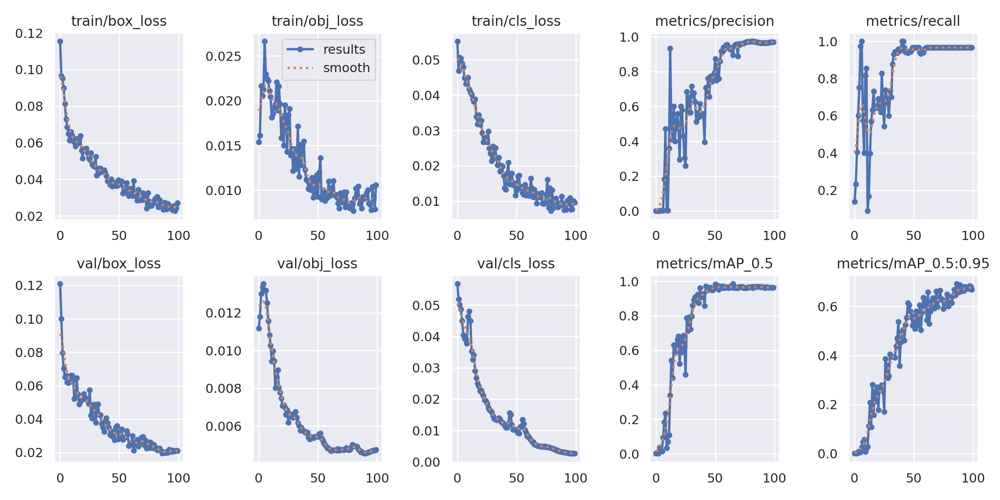

In [26]:
from utils.plots import plot_results
Image(filename='/content/yolov5/runs/train/yolov5_results/results.png', width=1000)

Ground Truth Training Data :


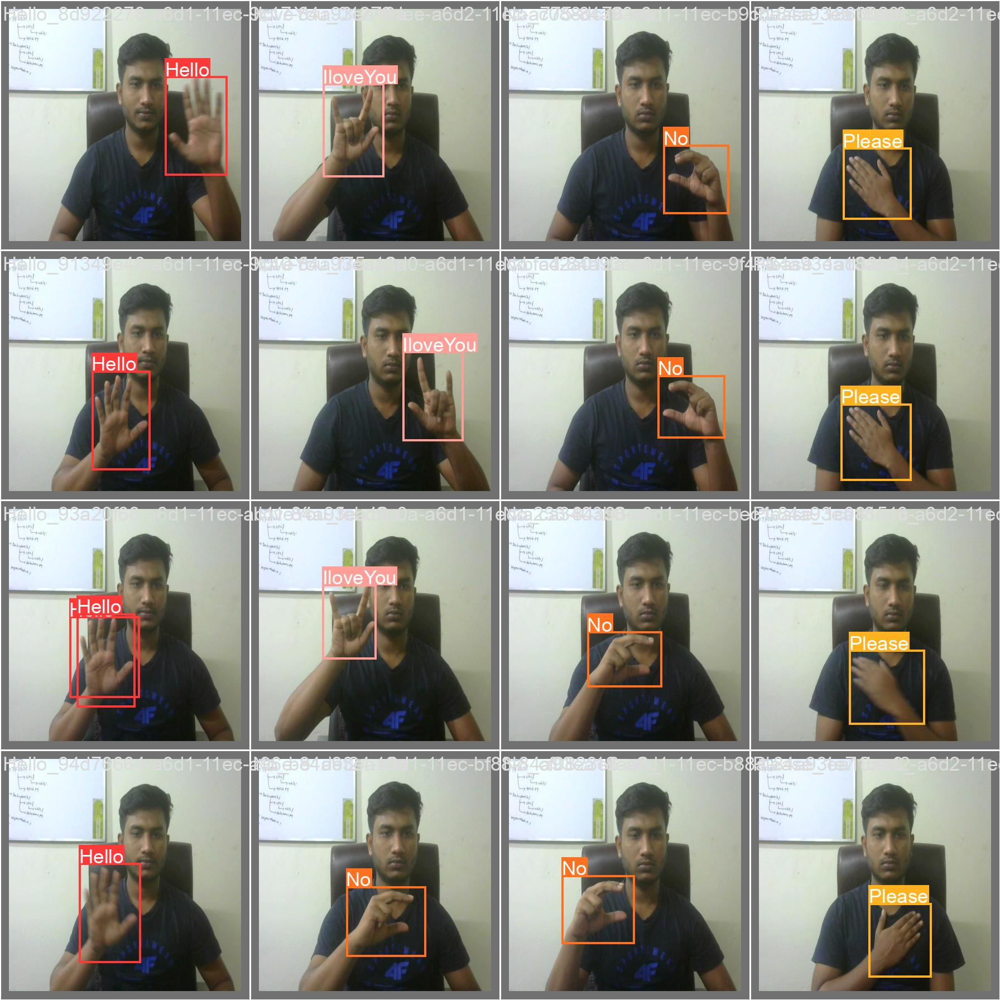

In [30]:
print("Ground Truth Training Data :")

Image(filename="/content/yolov5/runs/train/yolov5_results/val_batch0_labels.jpg", width=1000)

Ground Augmented Truth Training Data :


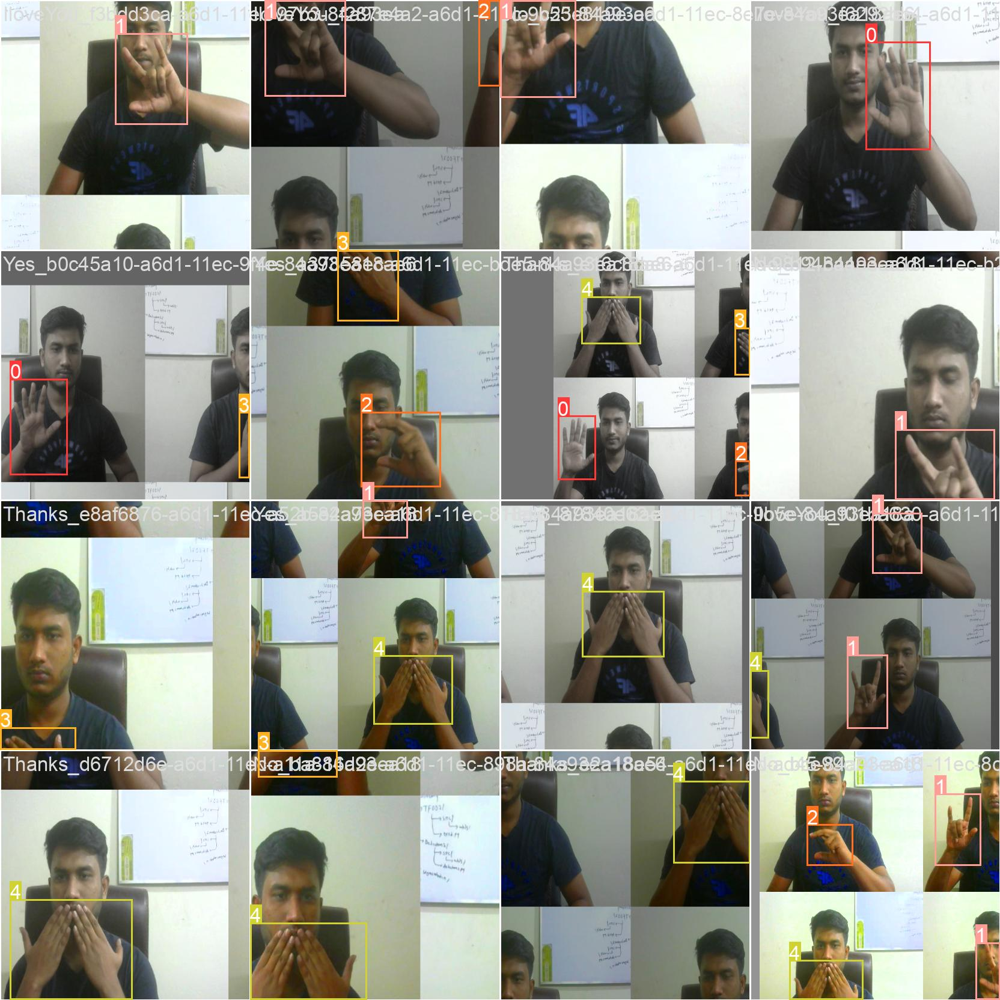

In [31]:
## print out augmented training example

print("Ground Augmented Truth Training Data :")

Image(filename="/content/yolov5/runs/train/yolov5_results/train_batch0.jpg", width=1000)

In [32]:
## Run Inference with trained weights

%ls runs/

train/


In [34]:
%ls /content/yolov5/runs/train/yolov5_results/weights

best.pt  last.pt


In [35]:
%cd /content/yolov5/

!python detect.py --weights /content/yolov5/runs/train/yolov5_results/weights/best.pt --img 416 --conf 0.5 --source ../test/images


/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5_results/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-398-g5cdad892 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/11 /content/test/images/Hello_81794bae-a6d1-11ec-9ec1-84a93ea18ae6_jpg.rf.0d31bbda741f3244a5afab953f867784.jpg: 416x416 1 Hello, 7.1ms
image 2/11 /content/test/images/Hello_89f10330-a6d1-11ec-85f2-84a93ea18ae6_jpg.rf.cf59a8257af8ca9f59547e340bab88da.jpg: 416x4

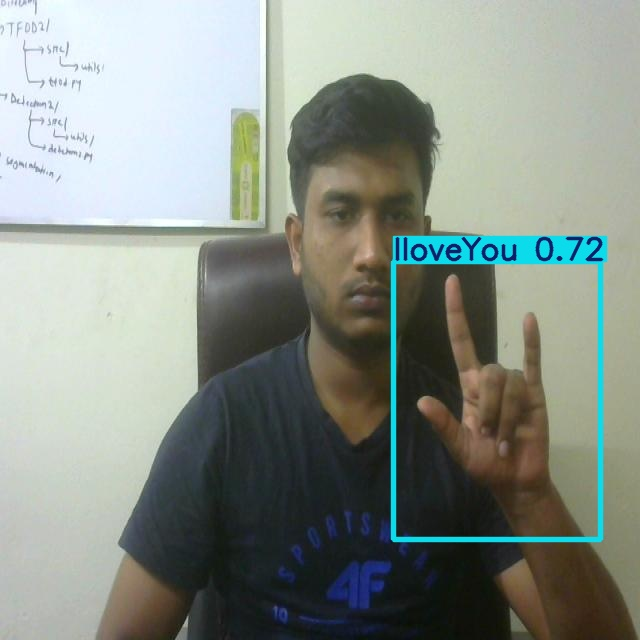

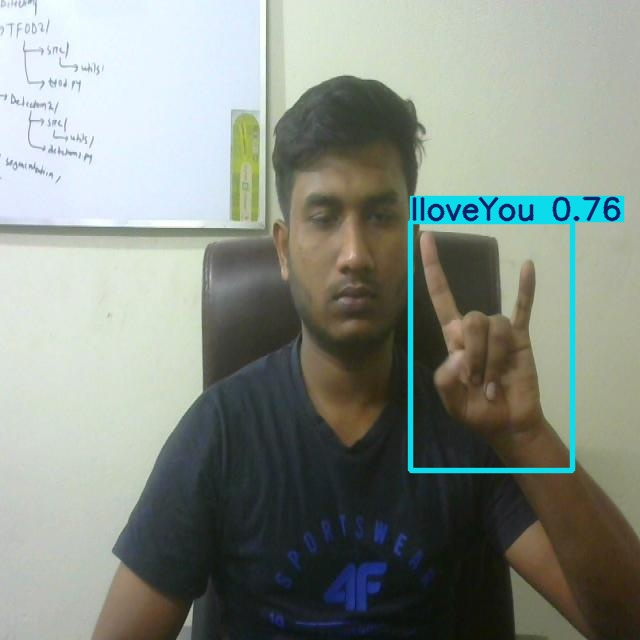

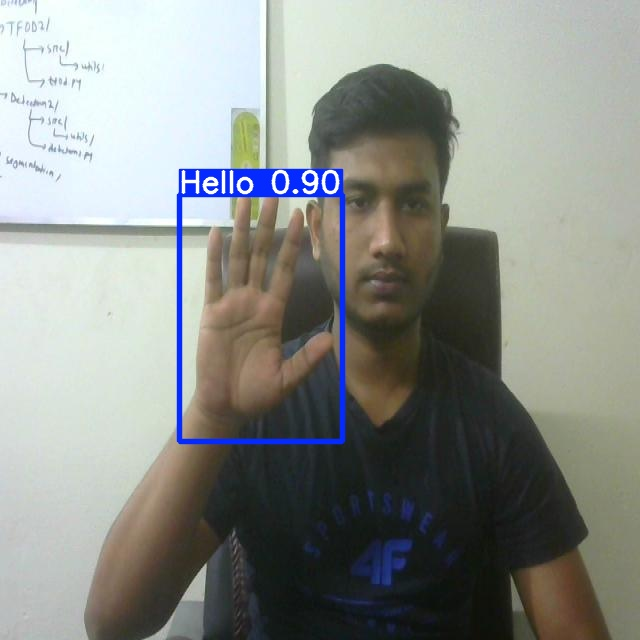

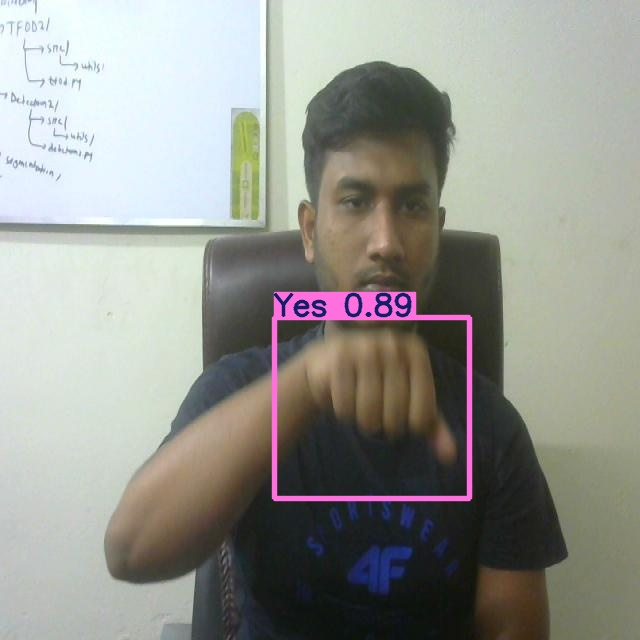

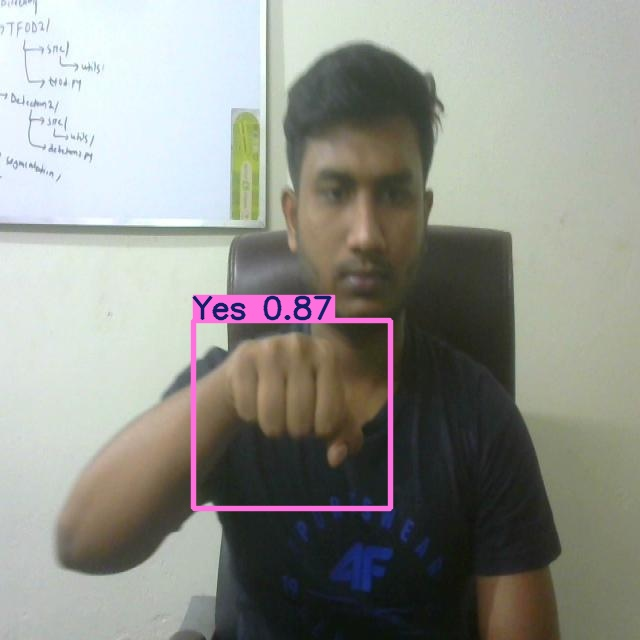

...

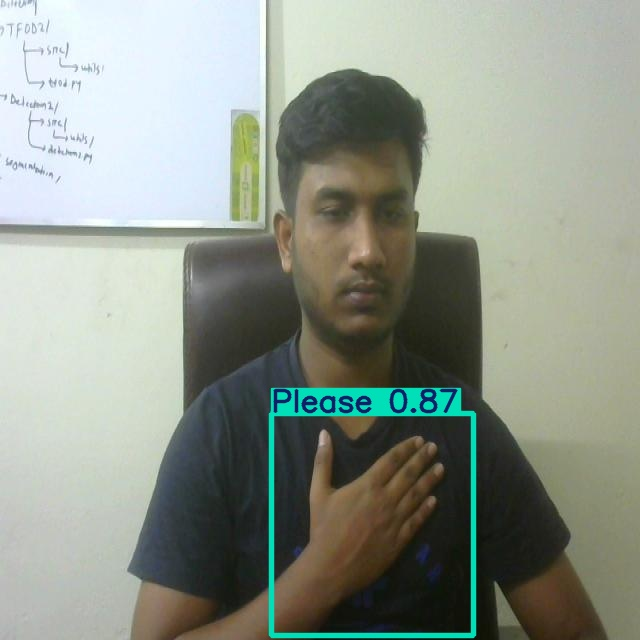

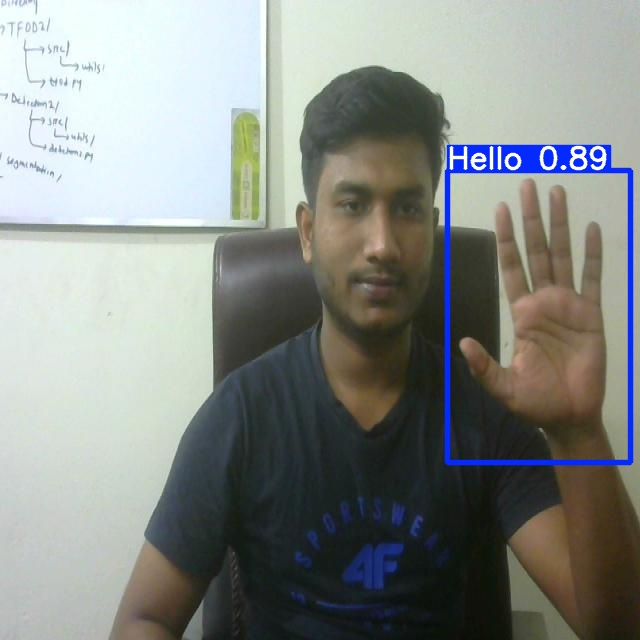

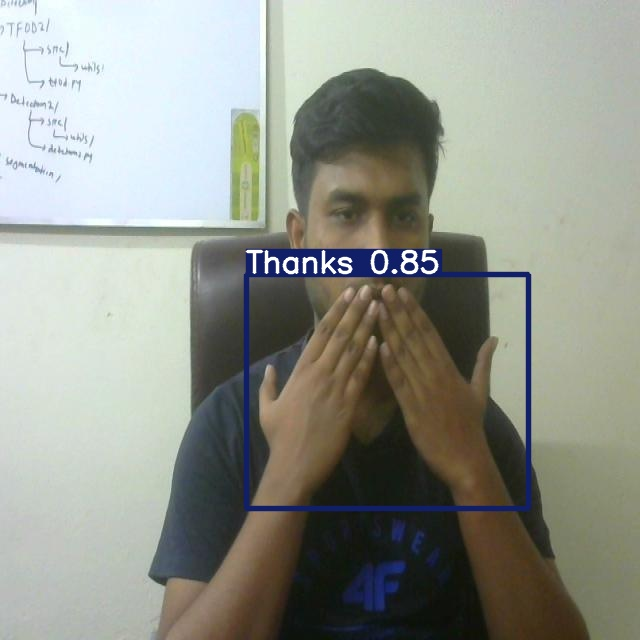

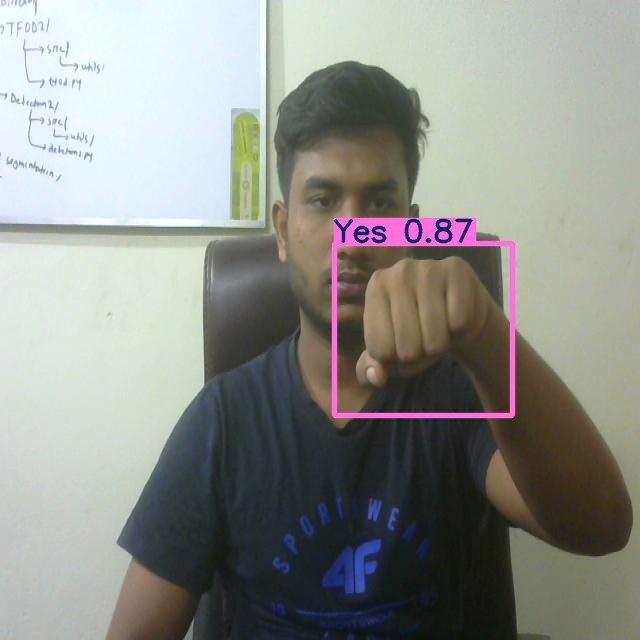

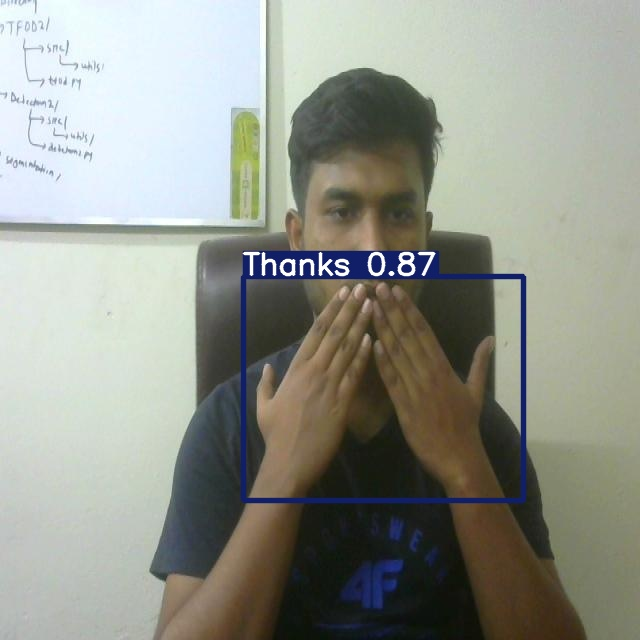

In [37]:
## display inference on all Images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  display(Image(filename=imageName))
  print("\n")

In [38]:
## Export trained folder for future inference

from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [39]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/Research/SignLanguageDetection/model

cp: cannot stat '/content/yolov5/runs/train/yolov5s_results/weights/best.pt': No such file or directory
